# Рынок заведений общественного питания Москвы

### Цель: 
**Подготовить исследование рынка Москвы, найти интересные особенности (местоположение, часы работы, сетевое/несетевое, рейтинг, популярность). Дать рекомендации, которые в будущем помогут открыть новое заведение.**

### Описание данных:
Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

###  Оглавление

1. [Открытие данных](#start)
2. [Предобработка данных](#data_preprocessing)
4. [Исследовательский анализ данных](#analysis)
5. [Детализируем исследование: открытие кофейни](#details)
6. [Общий вывод](#conclusion)

In [86]:
#!pip install folium

In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

## Открытие данных <a id="start"></a>

In [88]:
data = pd.read_csv('datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [89]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [90]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Среди заведений с одинаковыми названием и категорией в некоторых колонках присутствуют пропущенные значения.

## Предобработка данных <a id="data_preprocessing"></a>

In [91]:
print('Доля пропущенных значений:')
pd.DataFrame(round(data.isna().mean()*100,1)).style.background_gradient('coolwarm')

Доля пропущенных значений:


,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


In [92]:
data = data.drop(data[data['hours'].isna()].index)

Доля пропусков в столбце *hours* составляет 6.4. Таким образом, можно удалить строки с пропущенными значениями в данном столбце.

In [93]:
# убираем неявные дубликаты
data['name'] = data['name'].str.replace('9 Bar Coffe', '9 Bar Coffee')
data['name'] = data['name'].str.replace('Bb grill', 'Bb Grill')
data['name'] = data['name'].str.replace('Carrots and beans', 'Carrots and Beans')
data['name'] = data['name'].str.replace('Cofe Fest', 'CofeFest')
data['name'] = data['name'].str.replace('Corner cafe&kitchen', 'Corner cafe & kitchen')
data['name'] = data['name'].str.replace('Di villaggio', 'Di Villaggio')
data['name'] = data['name'].str.replace('Festa&Тесто', 'Festa & Тесто')
data['name'] = data['name'].str.replace('Hellopapaya', 'HelloPapaya')
data['name'] = data['name'].str.replace('Istanbul kebab', 'Istanbul Kebab')
data['name'] = data['name'].str.replace('MainFood', 'Main Food')
data['address'] = data['address'].apply(str.lower)

In [94]:
# check duplicates
print('Дубликаты: {}'.format(any(data.duplicated())))

Дубликаты: False


Пропущенные значения в столбце *price* можно заполнить, проанализировав значения столбца *avg_bill*. Что касается остальных столбцов, то их можно проигнорировать на данный момент

In [95]:
# create new column street
def extract_street(row):
    tmp = row['address'].split(', ')
    return(tmp[1])

data['street'] = data.apply(extract_street, axis=1) 

In [96]:
# create new column is_24/7 
def check_hours(row):
    if 'круглосуточно' in str(row['hours']):
        return True
    return False
    
data['is_24/7'] = data.apply(check_hours, axis=1)

- Добавлена новая колонка *street* с названиями улиц

- Убраны неявные дубликаты в столбце *name*

- Добавлена новая колонка *is_24/7* для различия круглосуточных и некруглосуточных заведений

## Исследовательский анализ данных <a id="analysis"></a>

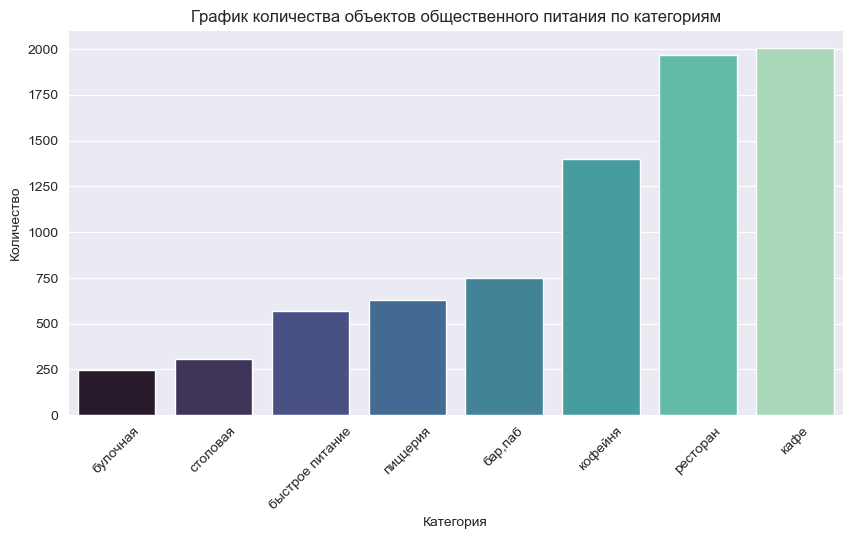

In [97]:
pivot_category = data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name')
pivot_category.columns = ['count']

sns.set_style("darkgrid")
custom_palette = sns.color_palette("mako", 8)
sns.set_palette(custom_palette)
plt.figure(figsize=(10, 5))
sns.barplot(x=pivot_category.index, y='count', data=pivot_category)
plt.title('График количества объектов общественного питания по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.show()

Лидирующее место по количеству данных среди разных категорий заняли кафе и рестораны, меньше всего данных у булочных и столовых. Этот факт может повлиять на результаты исследования.

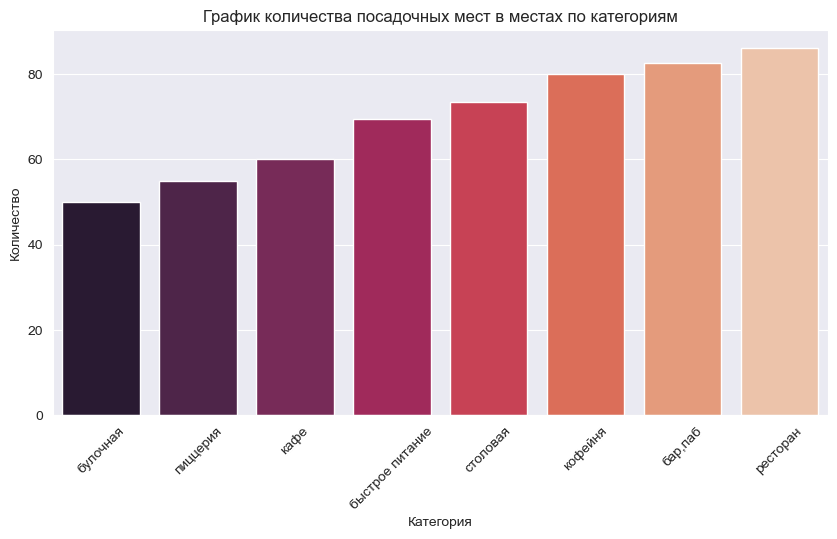

In [98]:
pivot_seats = data.pivot_table(index='category', values='seats', aggfunc='median').sort_values(by='seats')
pivot_seats.columns = ['median']

sns.set_style("darkgrid")
custom_palette = sns.color_palette("rocket", 8)
sns.set_palette(custom_palette)
plt.figure(figsize=(10, 5))
sns.barplot(x=pivot_seats.index, y='median', data=pivot_seats)
plt.title('График количества посадочных мест в местах по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.show()

Больше всего посадочных мест в ресторанах и барах (>80), а меньше всего в булочных и пиццериях (<60).

In [99]:
labels = ['несетевое', 'сетевое']
fig = go.Figure(data=[go.Pie(labels=labels, values=data['chain'].value_counts())])
fig.update_layout(title='График соотношения сетевых и несетевых заведений')
fig.show() 

Сетевых заведений значительно меньше.

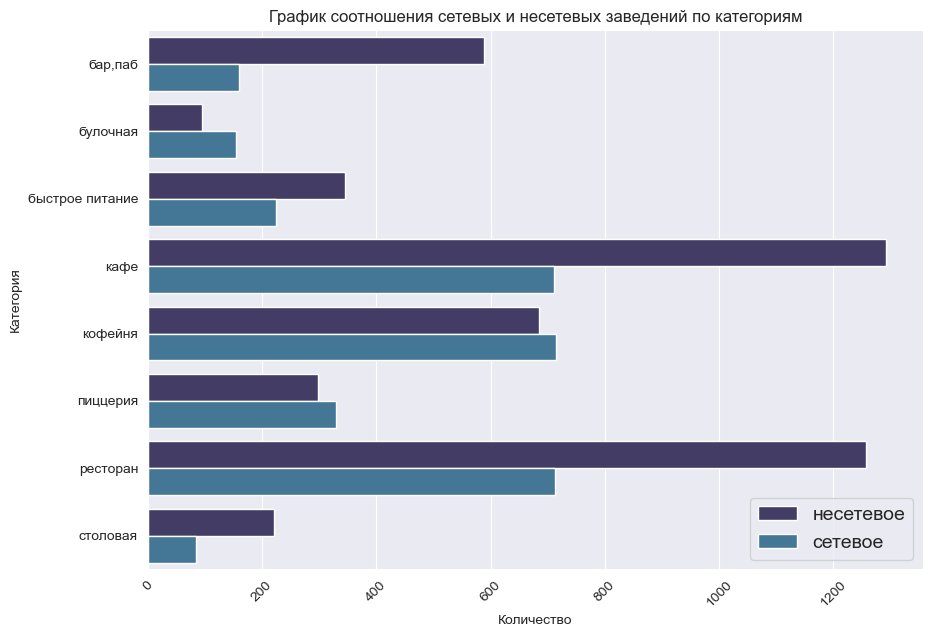

In [100]:
chain_by_category = data.groupby(['category', 'chain'], as_index = False)[['name']].count()
fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(10)
ax = sns.barplot(x='name', y='category', data=chain_by_category, hue='chain', palette=sns.color_palette("mako", 3))
hands, labs = ax.get_legend_handles_labels()
plt.title('График соотношения сетевых и несетевых заведений по категориям')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.xticks(rotation=45)
plt.legend(handles=hands, labels=['несетевое', 'сетевое'], loc='lower right', fontsize=14)
plt.show()


- Среди пиццерий, кофеен и булочных преобладают сетевые заведения 

- Бары в основном представлены одиночными заведениями

- Несетевых кафе и ресторанов почти в два раза больше, чем сетевых

- Кафе, кофейни и рестораны составляют значительный процент сетевых заведений среди категорий

In [101]:
df_chain_share = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
df_chain_share.columns = ['not_chain', 'chain']
df_chain_share['total'] = df_chain_share['not_chain'] + df_chain_share['chain']
df_chain_share['share'] = (df_chain_share['chain']/df_chain_share['total']*100).round().astype('int')
df_chain_share.sort_values(by='share', ascending=False)

,not_chain,chain,total,share
category,,,,
булочная,95,154,249,62
пиццерия,298,330,628,53
кофейня,684,714,1398,51
быстрое питание,346,224,570,39
ресторан,1257,712,1969,36
кафе,1292,711,2003,35
столовая,221,85,306,28
"бар,паб",588,159,747,21


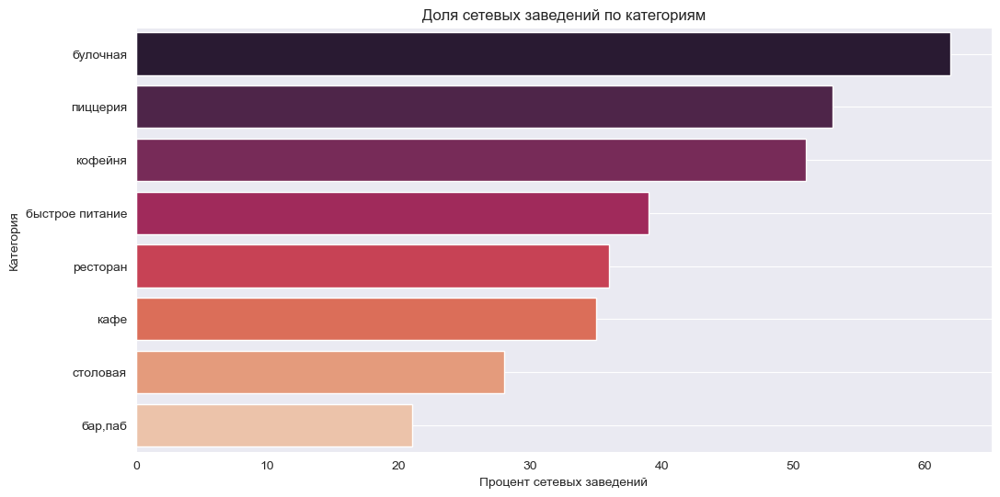

In [102]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='share', y='category', data=df_chain_share.reset_index().sort_values(by='share', ascending=False))
ax.set_xlabel('Процент сетевых заведений')
ax.set_ylabel('Категория')
ax.set_title('Доля сетевых заведений по категориям')

plt.grid()
plt.show()

In [103]:
most_popular = data.groupby(['name', 'category'], as_index = False)[['chain']].sum()
tmp = most_popular.sort_values(by='chain',ascending=False).head(15)

fig = px.bar(tmp, x='name', y='chain', color_discrete_sequence=px.colors.qualitative.Alphabet, color='name', template='seaborn')
fig.update_layout(title='Топ-15 популярных сетей в Москве',
                   xaxis_title='Название',
                   yaxis_title='Количество заведений',
                   showlegend=False
                 )
fig.show() 

In [104]:
fig = go.Figure(data=[go.Pie(labels=tmp['name'], values=tmp['chain'])])
fig.update_layout(title='Топ-15 популярных сетей в Москве')
fig.update_traces(textposition='inside', text=tmp['category'], textinfo='percent+label+text')
fig.show() 

Самым популярным местом оказалась кофейня "Шоколадница" (119 заведений). После в списке следуют пиццерии "Домино'с Пицца" и "Додо Пицца". В этих заведениях средние цены по городу, а также можно заказать доставку еды на дом. "Яндекс Лавка" заняла 5-ое место (69 заведений).  

In [105]:
by_district = data.groupby(['district', 'category'], as_index = False)[['name']].count()

fig = px.bar(by_district, x="district", y="name", color="category", color_discrete_sequence=px.colors.qualitative.T10, 
             template='seaborn', width=900, height=800)
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Название',
                   yaxis_title='Количество заведений',
                   legend=dict(title="Категория")
                 )
fig.show()

Всего в датасете представлено 9 административных округов. Лидирует по количеству заведений Центральный административный округ. Больше всего там находится ресторанов (670), кафе (464) и кофеен (428). На последнем месте Северо-Западный административный округ.

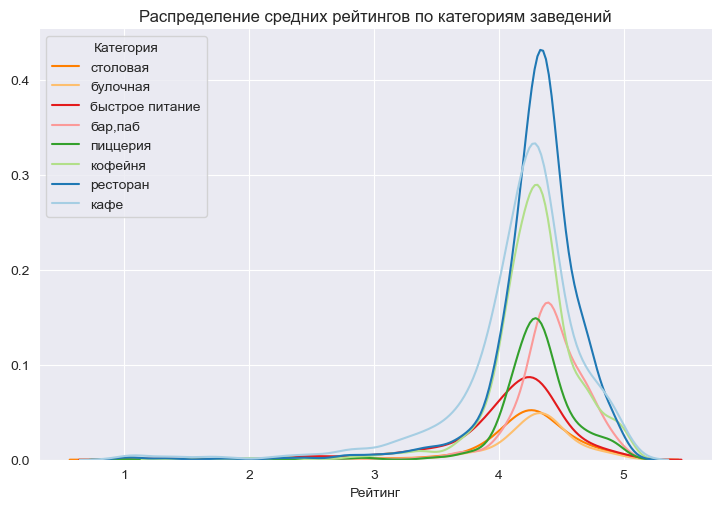

In [106]:
hue_order = ['кафе','ресторан','кофейня','пиццерия','бар,паб','быстрое питание','булочная','столовая']
sns.displot(data=data, x='rating', hue='category', kind='kde',
            hue_order=hue_order, palette=sns.color_palette('Paired',8), aspect=1.5, legend=False)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Рейтинг')
plt.ylabel('')
plt.legend(title='Категория', labels=hue_order[::-1])
plt.show()

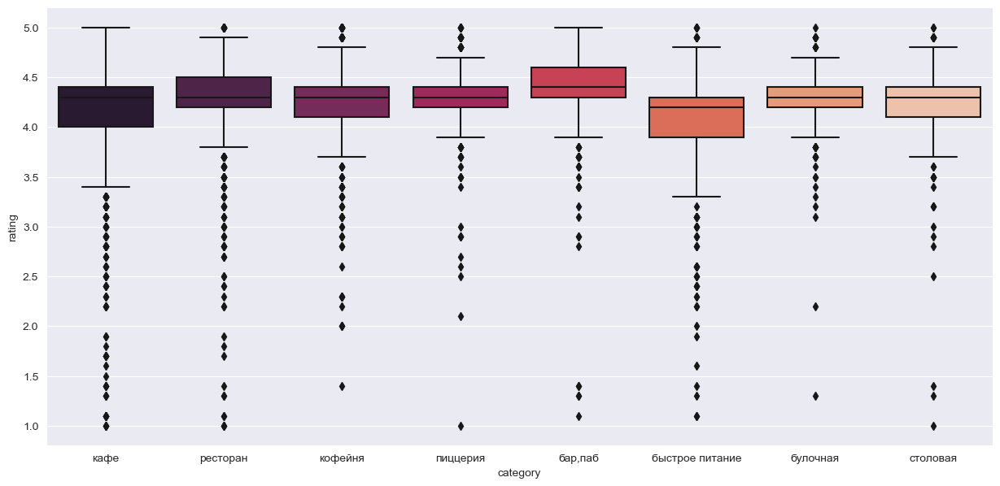

In [107]:
fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(15)
ax = sns.boxplot(x='category', y='rating', data=data)
plt.show()

Усреднённые рейтинги в разных типах общепита примерно одинаковые (~4.2).

In [108]:
state_geo = 'datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district','rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений каждого района'
).add_to(m)

m

У заведений в центре Москвы рейтинг лучше, чем в остальных районах.

In [109]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)
    
data.apply(create_clusters, axis=1)

m

In [110]:
tmp1 = data.groupby(['street', 'category'], as_index=False)['name'].count()
tmp = data.groupby('street', as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15)
tmp2 = tmp['street'].tolist()
by_street = tmp1.loc[tmp1['street'].isin(tmp2)]

fig = px.bar(by_street, x="street", y="name", color="category", color_discrete_sequence=px.colors.qualitative.T10, 
             template='seaborn', width=900, height=800)
fig.update_layout(title='Количество заведений каждой категории по улицам',
                  xaxis_title='Название',
                  yaxis_title='Количество заведений',
                  legend=dict(title="Категория"),
                  xaxis={'categoryorder': 'total descending'}
                 )
fig.show()

Больше всего заведений на проспекте Мира (>180). Среди них самую большую часть составляют кафе (53), рестораны (45) и кофейни (36). Среди улиц больше всего кофеен на Ленинградском проспекте. На МКАД находится 45 кафе.

In [111]:
f = {'name': 'count', 'chain': 'first', 'is_24/7': 'first'}
tmp = data.groupby('street', as_index=False).agg(f)
only_one = tmp.loc[tmp['name']==1]
print('total:', len(only_one))
print('is chain->')
print(only_one['chain'].value_counts())
print('is 24/7->')
print(only_one['is_24/7'].value_counts())

total: 470
is chain->
0    333
1    137
Name: chain, dtype: int64
is 24/7->
False    432
True      38
Name: is_24/7, dtype: int64


В датасете присутствует достаточно много улиц с одним заведением. Среди них большая часть это несетевые и некруглосуточные.

In [112]:
state_geo = 'datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

bill_df = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill_df,
    columns=['district','middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам'
).add_to(m)

m

In [113]:
bill_df.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


В центре Москвы и в Западном Административном округе цены выше, чем в других районах Москвы. Высокий средний чек можно заметить в районе Внуково и Сколково.

### Вывод

- Лидирующее место по количеству данных среди разных категорий заняли кафе и ресторан, меньше всего данных у булочной и столовой.


- Больше всего посадочных мест в ресторанах и барах (>80), а меньше всего в булочных и пиццериях (<60).


- Сетевых заведений значительно меньше.


- Усреднённые рейтинги в разных типах общепита примерно одинаковые (~4.2).


- В датасете присутствует достаточно много улиц с одним заведением. Среди них большая часть это несетевые и некруглосуточные.


- Среди пиццерий, кофеен и булочных преобладают сетевые заведения. Бары в основном представлены одиночными заведениями. Несетевых кафе и ресторанов почти в два раза больше, чем сетевых.


- Самым популярным местом оказалась кофейня "Шоколадница" (119 заведений). После в списке следуют пиццерии "Домино'с Пицца" и "Додо Пицца". В этих заведениях средние цены по городу, а также можно заказать доставку еды на дом. "Яндекс Лавка" заняла 5-ое место (69 заведений).


- Из 9 административных округов лидирует по количеству заведений Центральный административный округ. Больше всего там находится ресторанов (670), кафе (464) и кофеен (428). На последнем месте Северо-Западный административный округ.


- У заведений в центре Москвы рейтинг лучше, чем в оставшихся районах. В то же время средний чек там значительно выше, чем в других районах.


- Больше всего заведений на проспекте Мира (>180). Среди них самую большую часть составляют кафе (53), рестораны (45) и кофейни (36). Среди улиц больше всего кофеен на Ленинградском проспекте. На МКАД находится 45 кафе.


- В центре Москвы и в Западном Административном округе цены выше, чем в других районах Москвы. Высокий средний чек можно заметить в районе Внуково и Сколково.

## Детализируем исследование: открытие кофейни  <a id="details"></a>

- Сколько всего кофеен в датасете? 

- В каких районах их больше всего, каковы особенности их расположения?

- Есть ли круглосуточные кофейни?

- Какие у кофеен рейтинги? Как они распределяются по районам?

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [114]:
coffee_shops = data.loc[data['category']=='кофейня'] 
print('Кол-во кофеен:', len(coffee_shops))

Кол-во кофеен: 1398


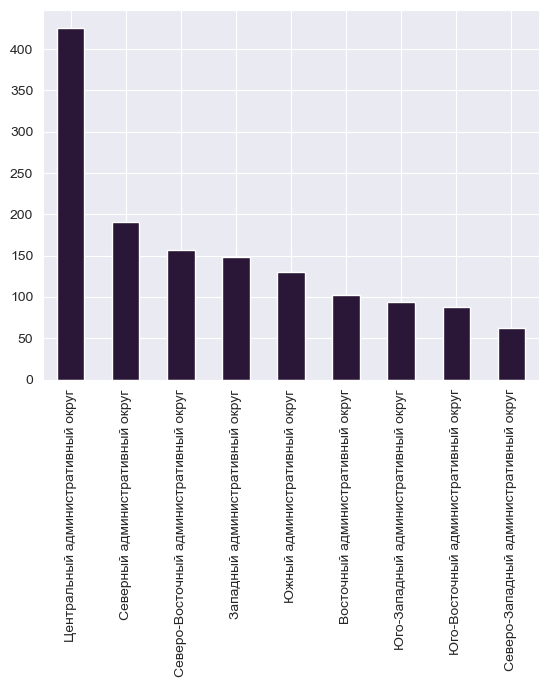

In [115]:
#tmp = coffee_shops.groupby('district', as_index=False)['name'].count()
tmp = coffee_shops['district'].value_counts().plot.bar()

Больше всего кофеен представлено в Центральном административном округе (428).

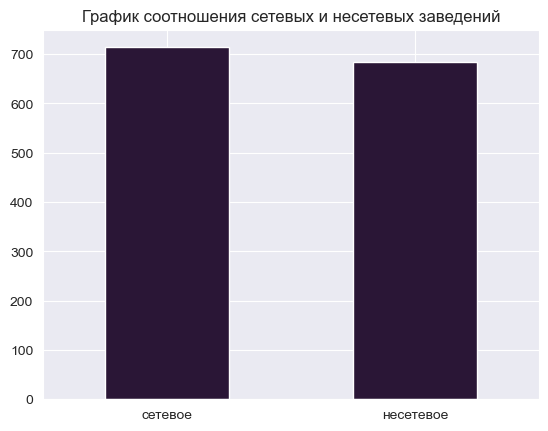

In [116]:
coffee_shops['chain'].value_counts()
labels = ['несетевое', 'сетевое']
tmp = coffee_shops['chain'].value_counts().plot.bar()
plt.title('График соотношения сетевых и несетевых заведений')
plt.xticks(coffee_shops['chain'].value_counts().index.tolist(), labels, rotation='horizontal')
plt.show()

Количество сетевых и несетевых кофеен примерно одинаковое.

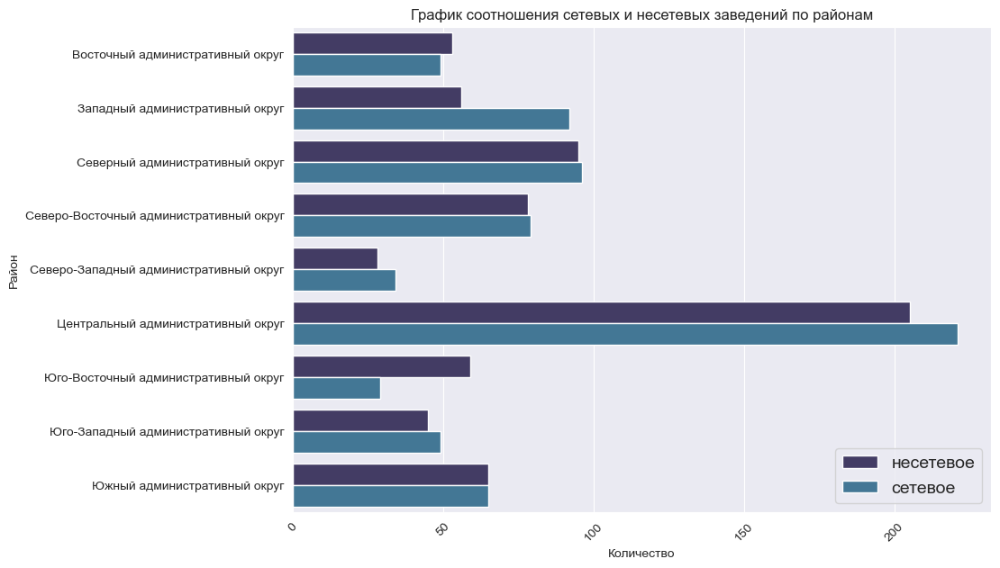

In [117]:
chain_by_district = coffee_shops.groupby(['district', 'chain'], as_index = False)[['name']].count()
fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(10)
ax = sns.barplot(x='name', y='district', data=chain_by_district, hue='chain', palette=sns.color_palette("mako", 3))
hands, labs = ax.get_legend_handles_labels()
plt.title('График соотношения сетевых и несетевых заведений по районам')
plt.xlabel('Количество')
plt.ylabel('Район')
plt.xticks(rotation=45)
plt.legend(handles=hands, labels=['несетевое', 'сетевое'], loc='lower right', fontsize=14)
plt.show()

В Юго-Восточном районе ярко выражено преобладание несетвых кофеен.

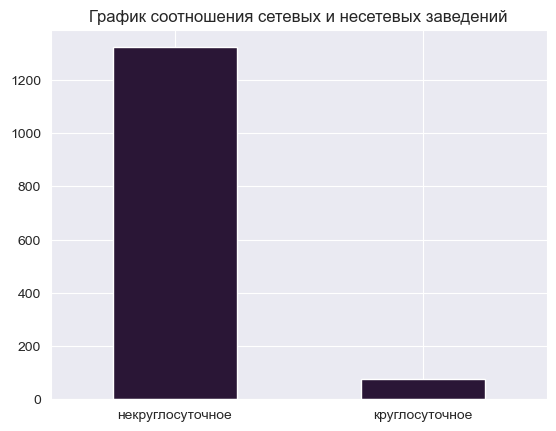

In [118]:
coffee_shops['is_24/7'].value_counts()
labels = ['некруглосуточное', 'круглосуточное']
tmp = coffee_shops['is_24/7'].value_counts().plot.bar()
plt.title('График соотношения сетевых и несетевых заведений')
plt.xticks(coffee_shops['is_24/7'].value_counts().index.tolist(), labels, rotation='horizontal')
plt.show()

В основном у кофеен в Москве некруглосутчный режим работы.

In [119]:
print('median:', coffee_shops['rating'].median())
print('mean:', coffee_shops['rating'].mean())

median: 4.3
mean: 4.275035765379113


In [120]:
tmp = coffee_shops.groupby('district', as_index=False)['rating'].mean()
tmp.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.336150
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.292147
0,Восточный административный округ,4.276471
7,Юго-Западный административный округ,4.274468
8,Южный административный округ,4.232308
6,Юго-Восточный административный округ,4.217045
3,Северо-Восточный административный округ,4.214013
1,Западный административный округ,4.191892


 Самые высокие рейтинги в Центральном и Северо-Западном административных округах (4.3).

In [121]:
tmp = coffee_shops.groupby('district', as_index=False)['middle_coffee_cup'].median()
tmp.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Самая высокая цена за чашку кофе в Юго-Западном административном округе (медиана 198). Самое дешевое капучино в Восточном административном округе (медиана 135).

### Вывод

- Всего в датасете представлено 1413 кофеен, большинство которых некруглосуточные (1337). 


- Больше всего кофеен находится в Центральном административном округе (428), а меньше всего в Северо-Западном административном округе. Также именно в этих районах средний рейтинг кофеен составляет 4.3, что выше среди всех районов.


- Сетевых и несетевых кофеен примерно одинаковое количество (720 и 693).


- Самая высокая цена за чашку кофе в  Юго-Западном административном округе (медиана 198). Самое дешевое капучино в Восточном административном округе (медиана 135).	

## Общий вывод <a id="conclusion"></a>

### Рекомендации

- В выборе цены за чашку кофе следует опираться на местоположение. Средняя цена за чашку кофе разнится в зависимости от района. Также стоит учесть стоимость аренды. Очевидно, что аренда будет выше на центральных улицах, возле бизнес-центров и ВУЗов. Но такие места хороши тем, что находятся в местах большого скопления людей.


- Несмотря на то, что в Северо-Западном административном округе меньше всего кофеен, рейтинг там выше, чем в остальных. Если открыть кофейню в данном районе, то придется конкурировать с уже успешными заведениями.


- В районах, где кофеен уже достаточно много, важно найти свой стиль (изюминку), который поможет посетителям запомнить заведение из сотни других. Это может быть необычное название, интересный интерьер или же тема кофейни (в нашем случае сериал «Друзья»).

### Cтоимость чашки капучино 

По моему мнению, оптимальная цена за чашку капучино 160-170 рублей. Но с учетом инфляции эта цифра может увеличиться. Как было сказано ранее, существует несколько факторов, которые могут повлиять на финальную цену. Самым важным, на мой взгляд, является местоположение.  